Inferencing the Resnet50 model for Emotion Detection


In [23]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import os
import cv2
import random

In [64]:
!pip show scikit-learn

Name: scikit-learn
Version: 1.2.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: bigframes, fastai, imbalanced-learn, librosa, mlxtend, qudida, sklearn-pandas, yellowbrick


In [16]:
img = "/content/Nishant"

In [47]:
def collect_data(directory):
    data = []
    total = 0

    for index in enumerate(os.listdir(directory)):
        for image_file in os.listdir(os.path.join(directory)):
            img = cv2.imread(os.path.join(os.path.join(directory, image_file)))
            resized_image = cv2.resize(img, (48, 48))
            data.append(resized_image)
            total += 1

    print(f'Total data saved = {total}')
    return data

In [48]:
final_data = []

# Getting train_datas
print("Train Datas")

train_data = collect_data(img)
final_data.extend(train_data)

Train Datas
Total data saved = 784


In [49]:

final_data = random.sample(final_data,len(final_data))


In [50]:
data = np.array(final_data)

In [51]:
data.shape

(784, 48, 48, 3)

In [32]:
model_path = '/content/drive/MyDrive/resnet50.h5'

In [34]:
resnet = tf.keras.applications.resnet.ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(48, 48, 3)
)

94765736/94765736 [==============================] - 1s 0us/step


In [35]:
def build_model(bottom_model, classes):
    model = bottom_model.layers[-2].output
    model = GlobalAveragePooling2D()(model)
    model = Dense(classes, activation = 'softmax', name = 'out_layer')(model)
    return model

In [40]:
import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization, Activation
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [41]:
head = build_model(resnet, 7)

model = Model(inputs = resnet.input, outputs = head)

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 54, 54, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 24, 24, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 24, 24, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [44]:
model.load_weights('/content/drive/MyDrive/resnet50.h5')

In [55]:
import numpy as np
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

In [57]:

y_pred = model.predict(data)
y_pred_classes = np.argmax(y_pred, axis=1)

25/25 [==============================] - 5s 188ms/step


In [58]:
y_pred

array([[0.99999994, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.99999994, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.99999994, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.99999994, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [59]:
y_pred_classes = np.argmax(y_pred, axis=1)

In [60]:
y_pred_classes

array([0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0, 3, 3, 3, 3, 3, 3, 3,
       3, 0, 0, 0, 0, 0, 3, 0, 3, 3, 0, 0, 3, 0, 0, 3, 0, 0, 0, 3, 3, 3,
       3, 3, 3, 3, 0, 3, 0, 3, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 3, 3, 3, 3,
       3, 3, 0, 3, 3, 3, 0, 3, 0, 3, 0, 3, 3, 0, 3, 3, 0, 0, 0, 3, 3, 0,
       0, 3, 3, 3, 3, 0, 3, 0, 3, 0, 3, 3, 3, 3, 0, 0, 3, 0, 0, 0, 3, 3,
       3, 0, 3, 3, 0, 3, 3, 0, 0, 3, 0, 0, 3, 3, 0, 3, 3, 0, 0, 0, 0, 3,
       3, 0, 0, 3, 3, 0, 3, 0, 3, 0, 3, 0, 0, 0, 3, 0, 3, 0, 3, 3, 3, 0,
       3, 0, 3, 0, 0, 0, 3, 0, 3, 3, 3, 3, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0,
       3, 0, 0, 0, 3, 3, 3, 0, 0, 0, 0, 3, 3, 3, 0, 0, 3, 0, 3, 0, 0, 0,
       0, 3, 0, 3, 0, 3, 3, 0, 0, 0, 0, 0, 3, 0, 0, 3, 0, 3, 0, 0, 0, 3,
       3, 0, 3, 0, 0, 0, 0, 3, 0, 3, 3, 3, 3, 0, 3, 0, 0, 3, 3, 3, 3, 3,
       3, 0, 0, 3, 0, 3, 3, 0, 0, 3, 3, 3, 0, 3, 0, 3, 3, 0, 0, 0, 3, 3,
       0, 0, 0, 3, 3, 3, 3, 0, 3, 3, 3, 3, 0, 3, 3, 0, 0, 3, 0, 3, 0, 0,
       0, 0, 3, 3, 3, 0, 3, 0, 0, 3, 0, 3, 0, 0, 0,

In [62]:
import matplotlib.pyplot as plt

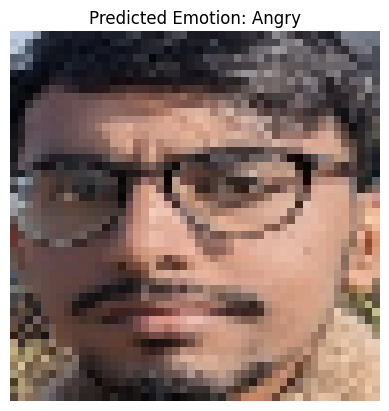

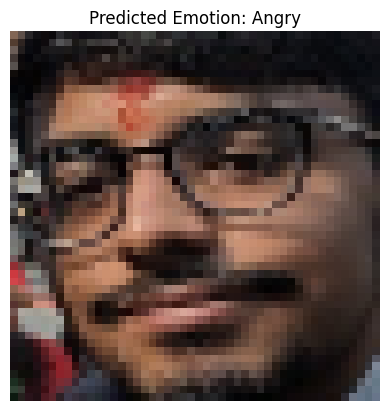

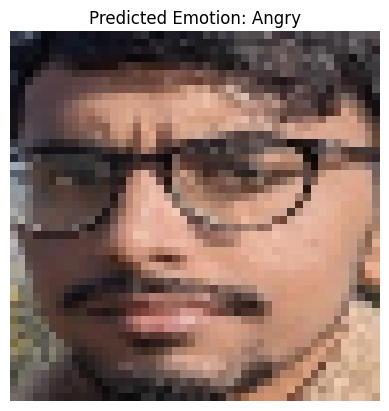

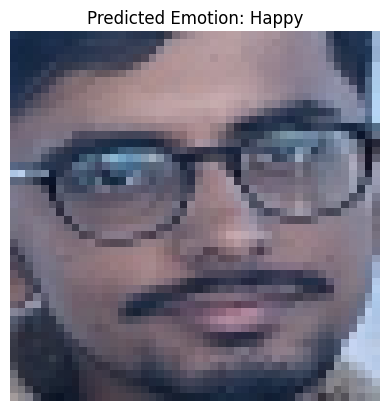

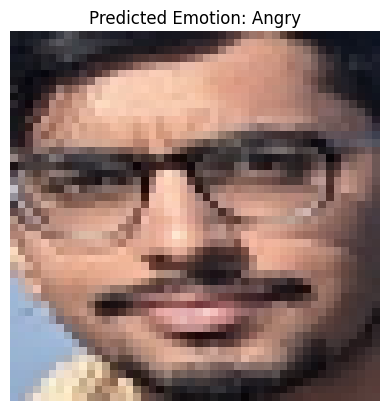

...

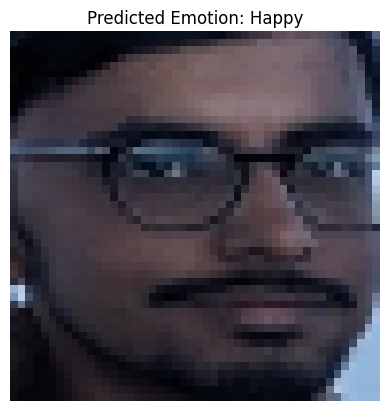

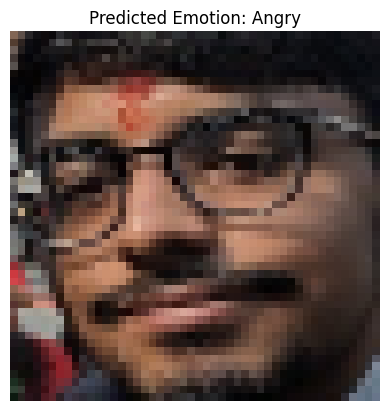

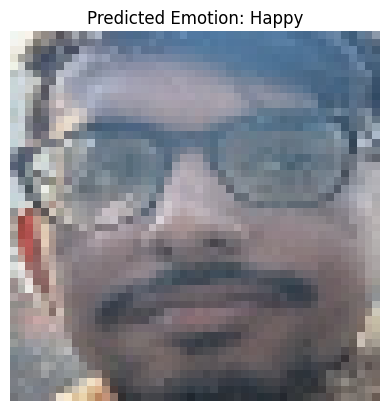

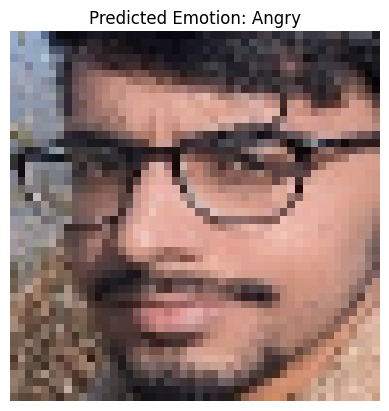

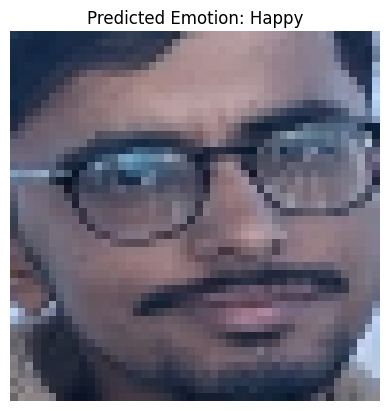

In [63]:
# Define emotion labels
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Display images and predicted emotions
for i in range(len(data)):
    img = cv2.cvtColor(data[i], cv2.COLOR_BGR2RGB)  # Convert image to RGB
    predicted_emotion = emotion_labels[y_pred_classes[i]]

    # Display image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted Emotion: {predicted_emotion}')
    plt.show()